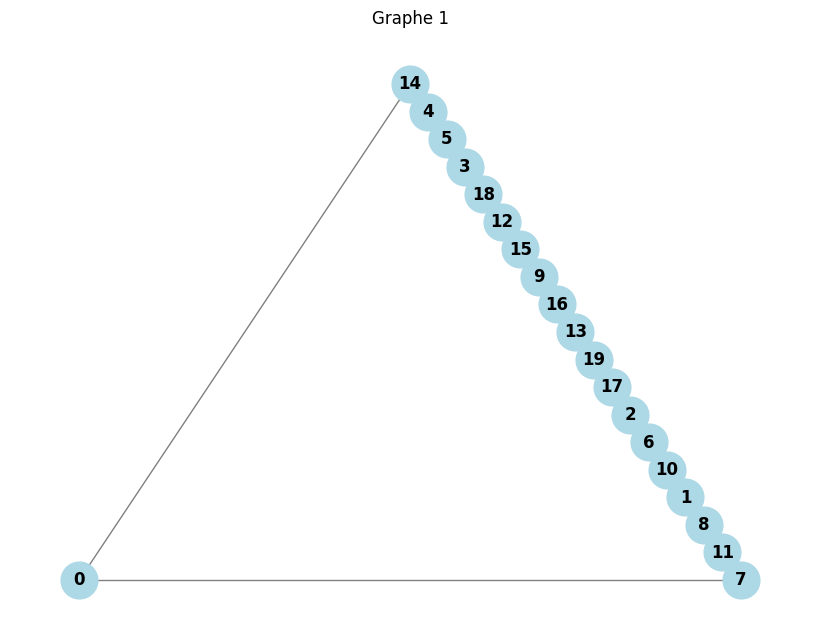

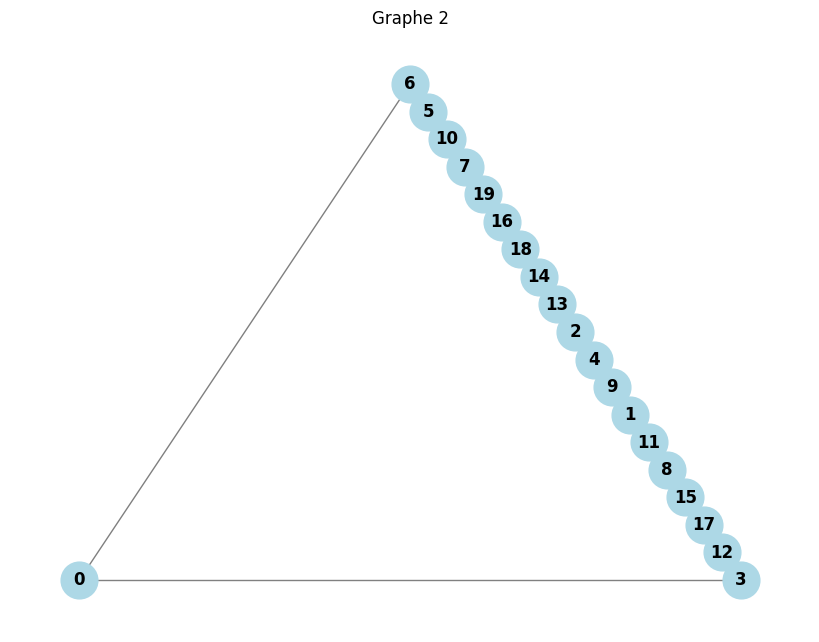

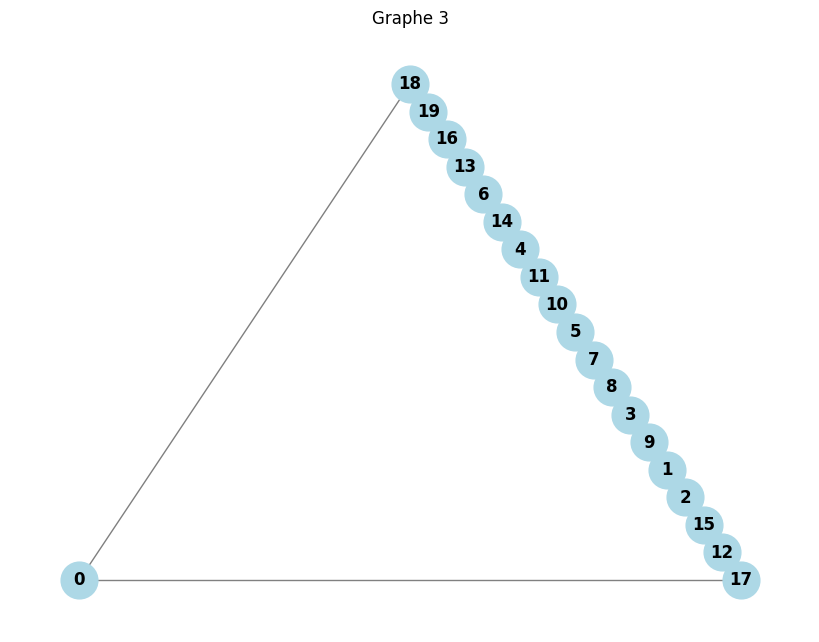

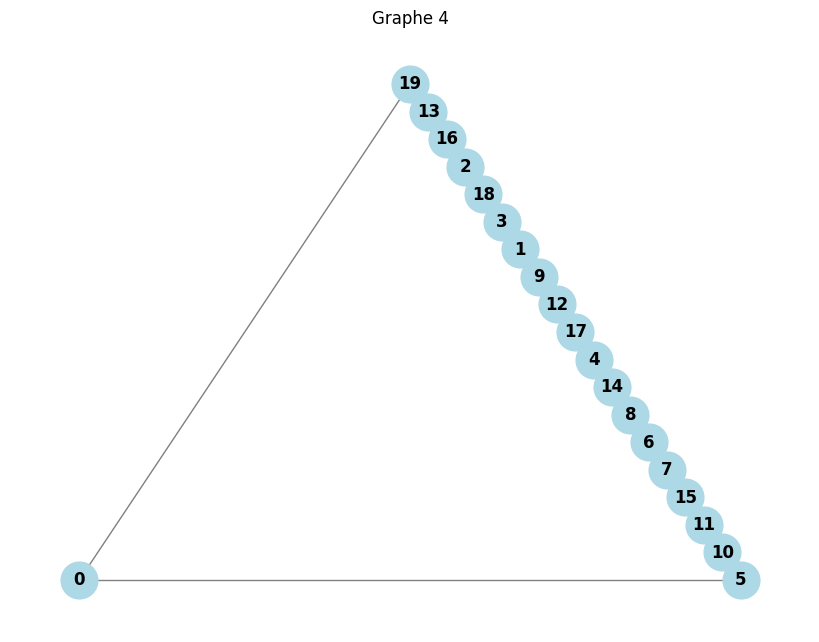

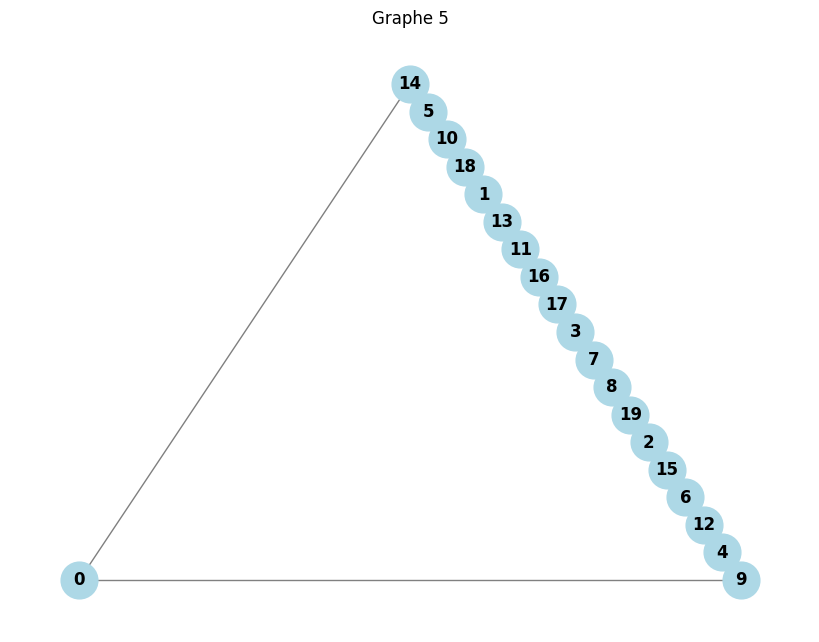

...

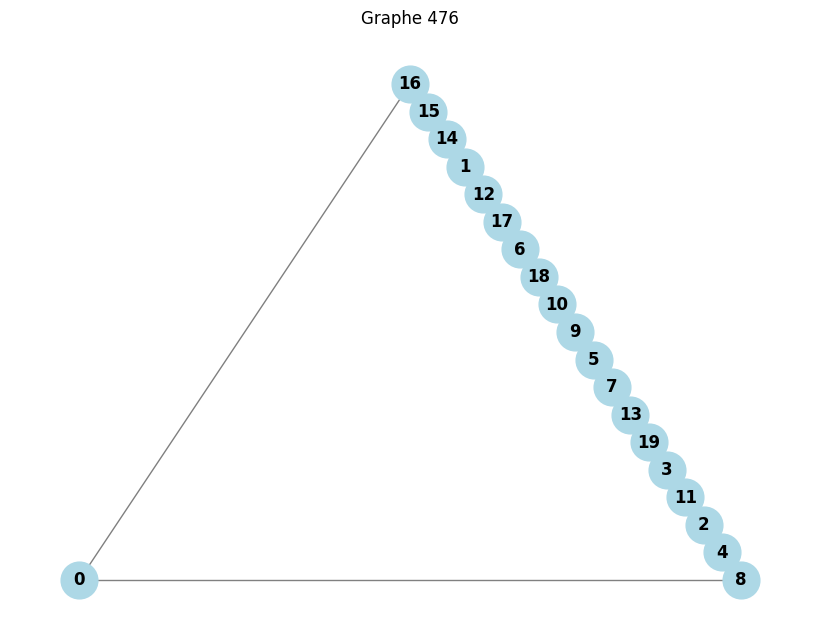

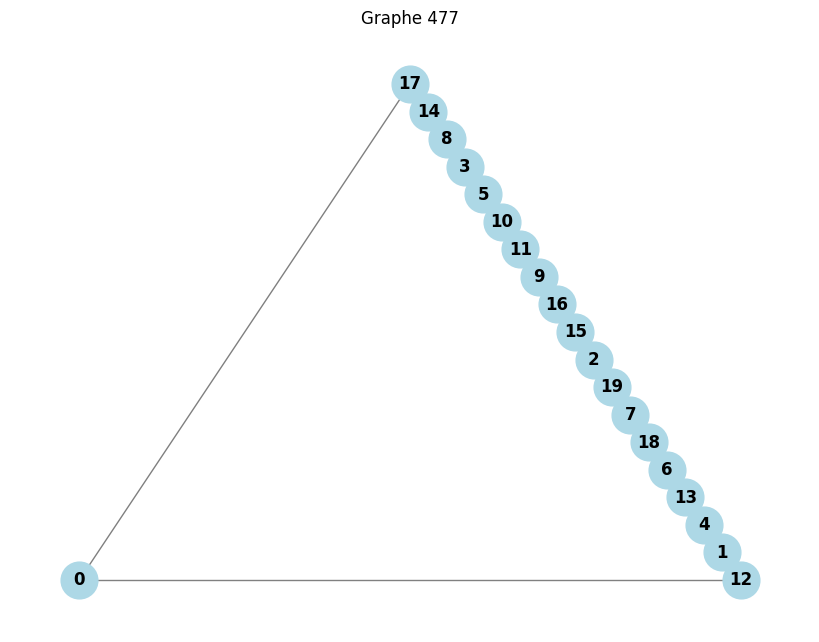

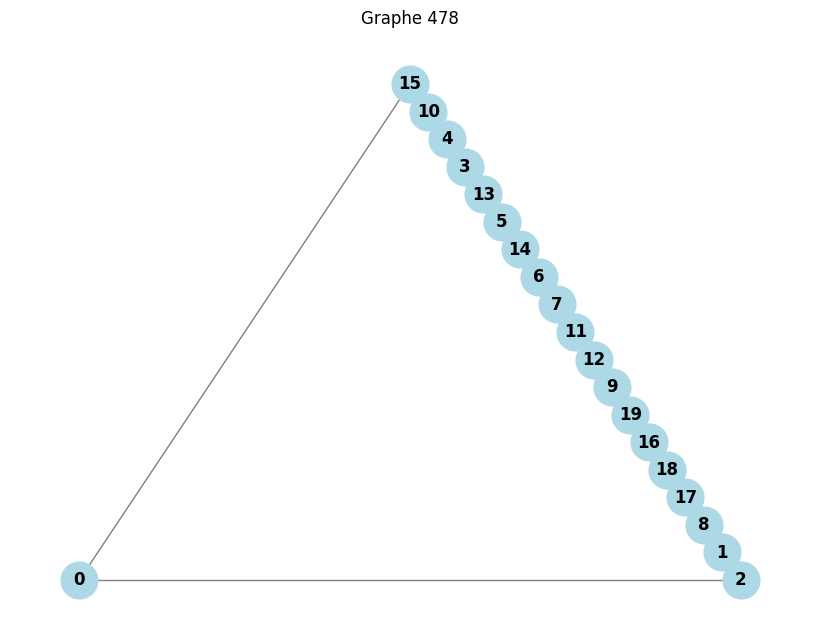

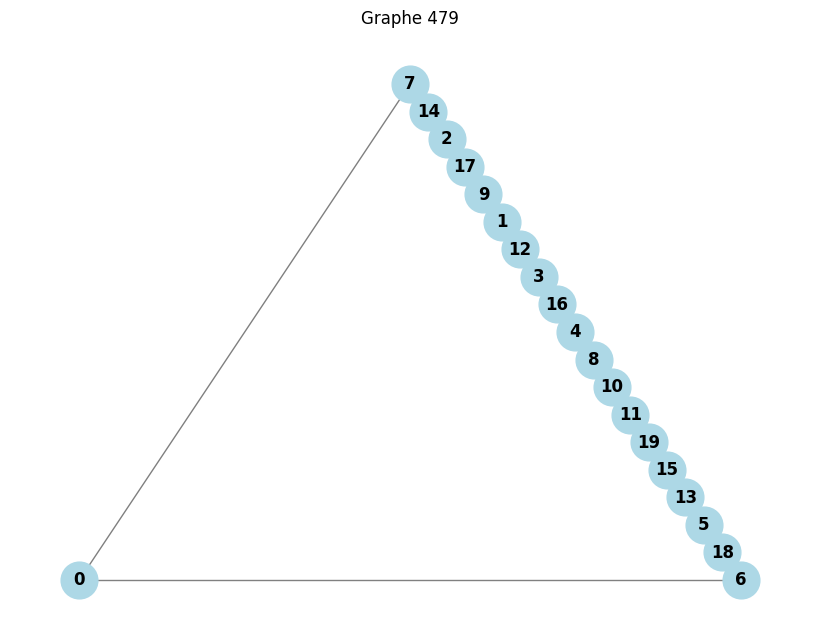

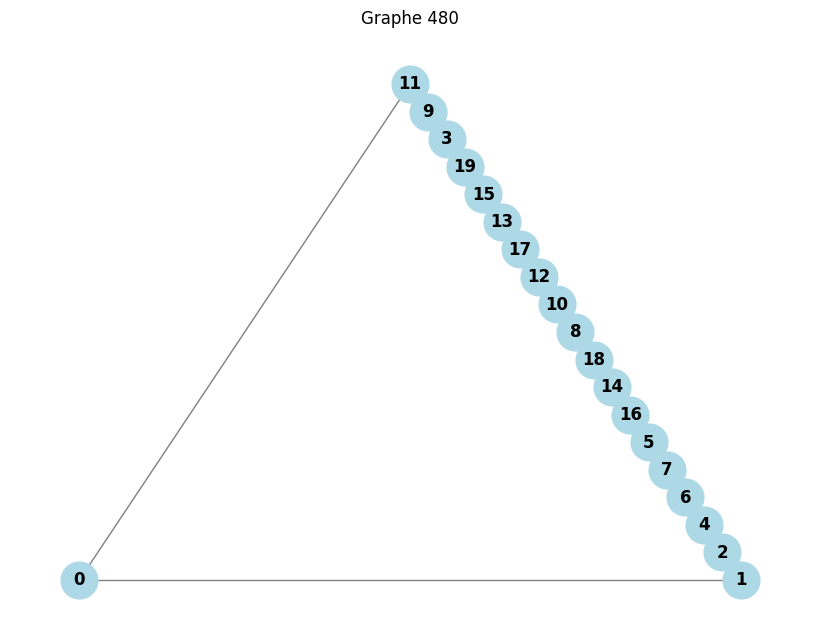

Epoch [0/15000], Loss D: 1.4036309719085693, Loss G: 0.9514989852905273
Epoch [500/15000], Loss D: 0.060654789209365845, Loss G: 6.65484619140625
Epoch [1000/15000], Loss D: 0.01603330671787262, Loss G: 5.943836212158203
Epoch [1500/15000], Loss D: 0.007342568598687649, Loss G: 5.969325065612793
Epoch [2000/15000], Loss D: 0.00731826014816761, Loss G: 6.840738773345947
Epoch [2500/15000], Loss D: 0.005936914589256048, Loss G: 7.36660623550415
Epoch [3000/15000], Loss D: 0.003241094062104821, Loss G: 7.363391399383545
Epoch [3500/15000], Loss D: 0.0016634538769721985, Loss G: 8.153958320617676
Epoch [4000/15000], Loss D: 0.0012894892133772373, Loss G: 10.63128662109375
Epoch [4500/15000], Loss D: 0.001283551100641489, Loss G: 9.049237251281738
Epoch [5000/15000], Loss D: 0.000804589013569057, Loss G: 8.433381080627441
Epoch [5500/15000], Loss D: 0.0004588323936332017, Loss G: 10.531108856201172
Epoch [6000/15000], Loss D: 0.0005119951092638075, Loss G: 9.80731201171875
Epoch [6500/15000

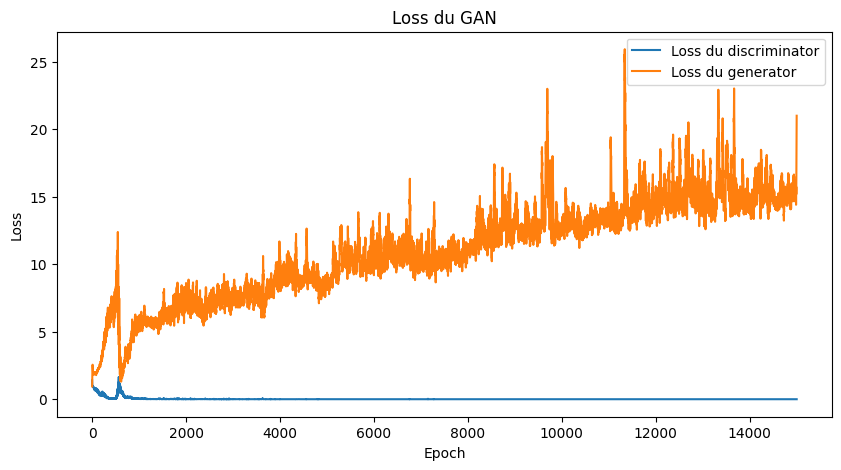

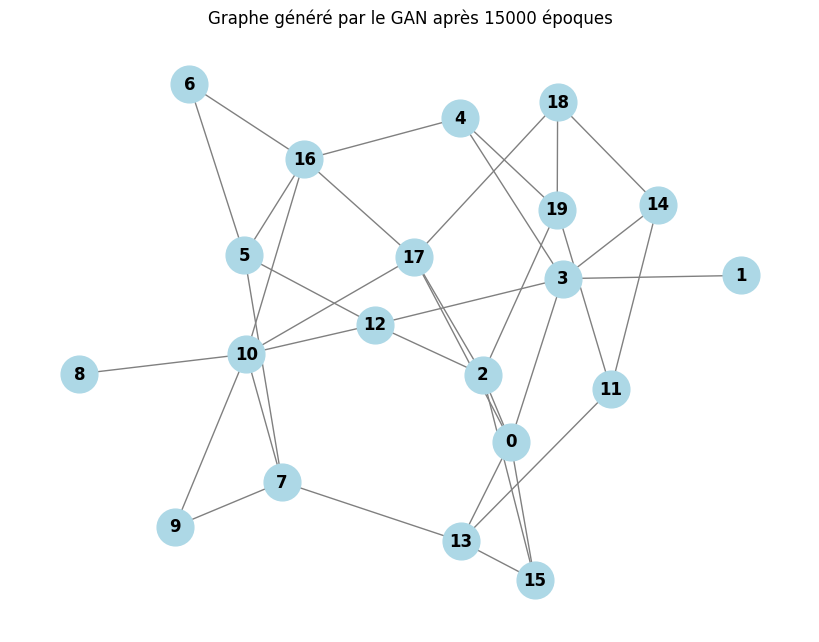

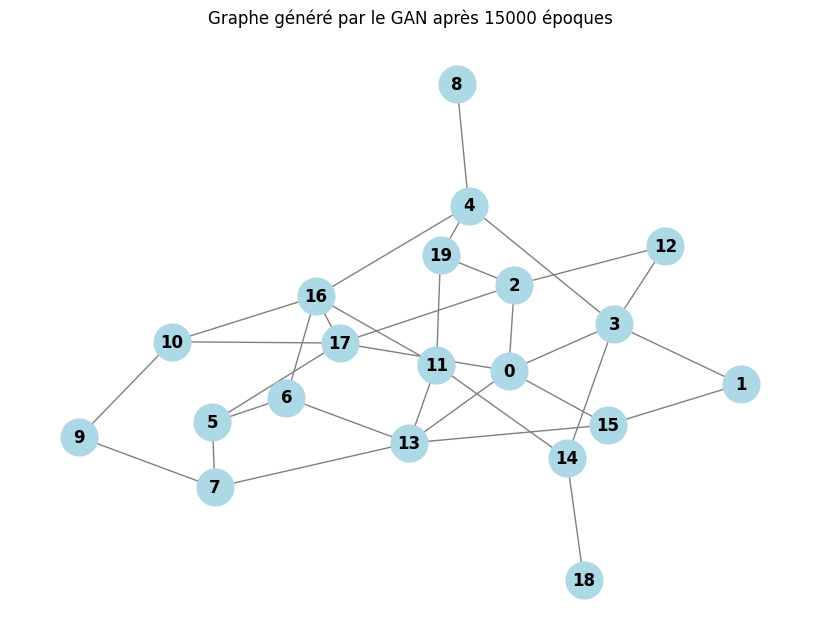

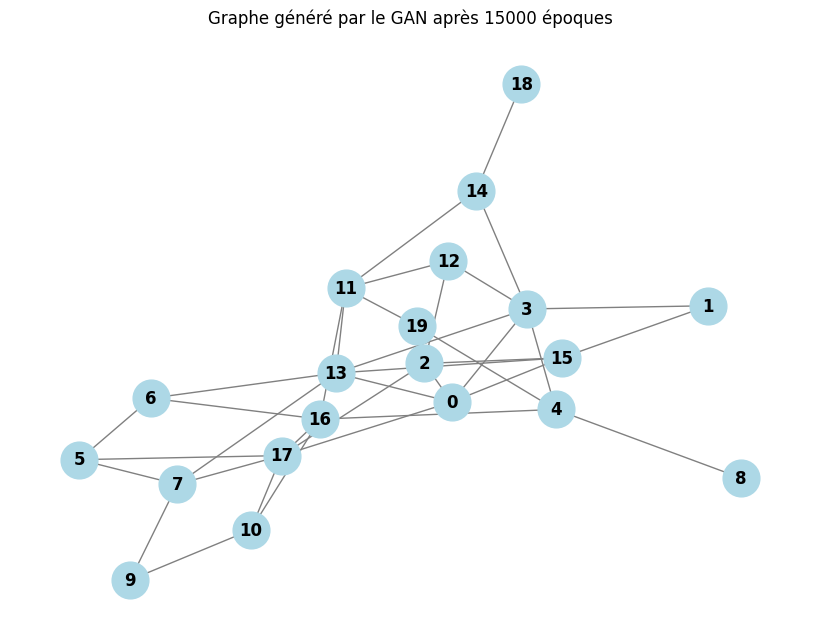

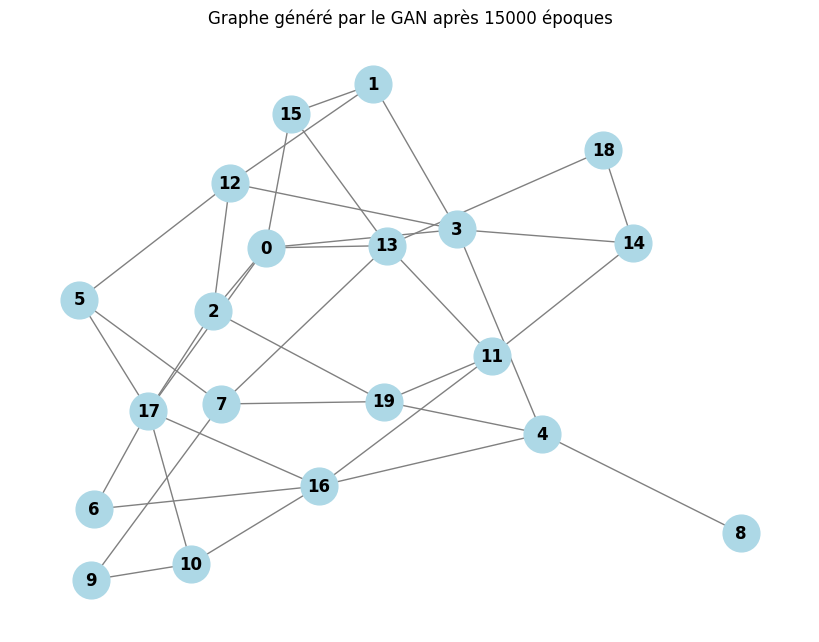

...

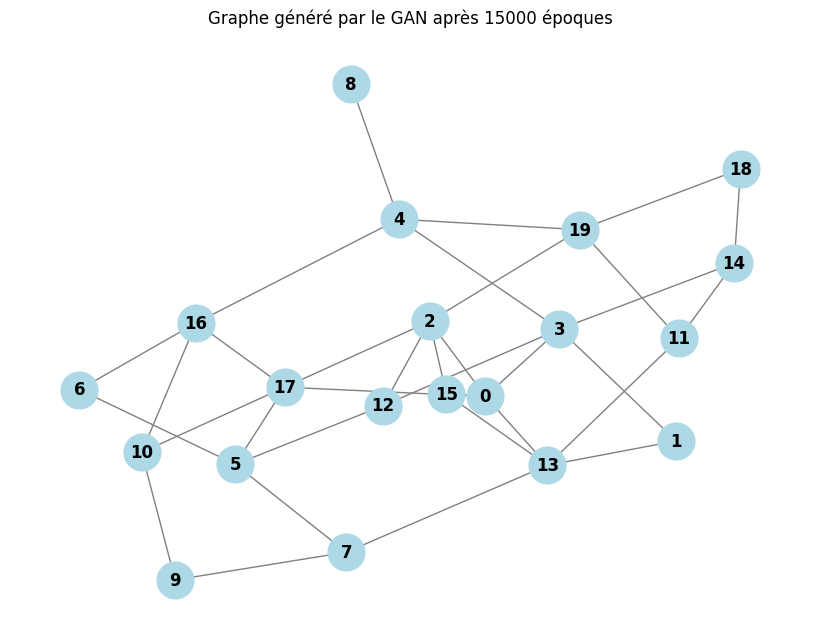

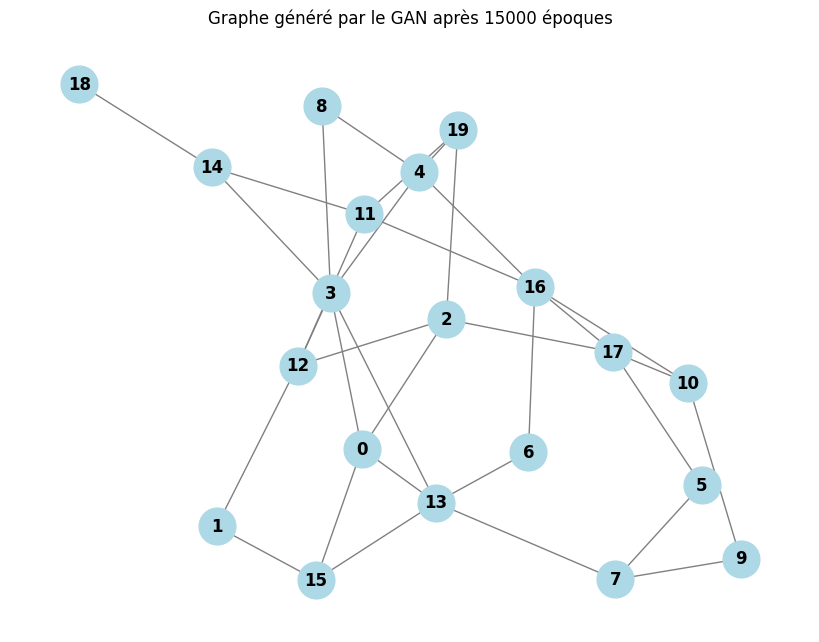

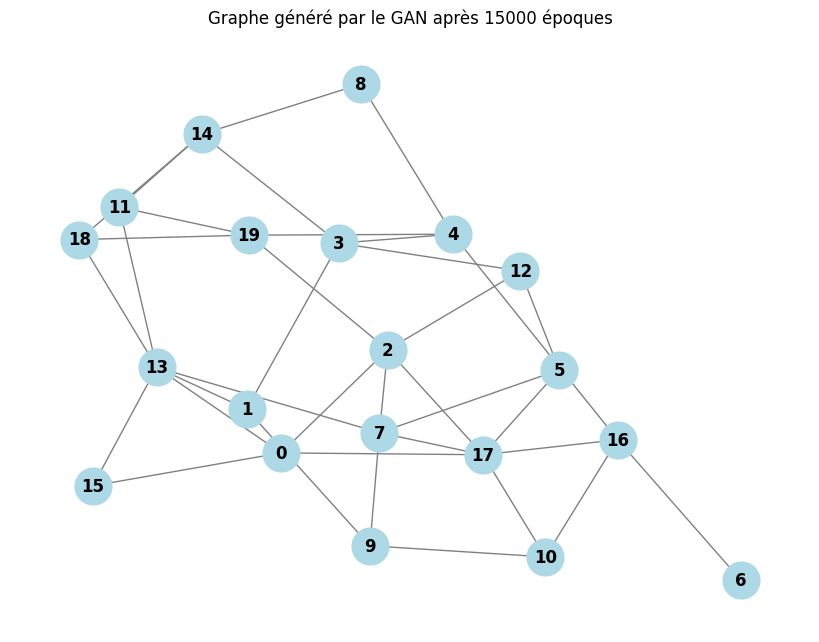

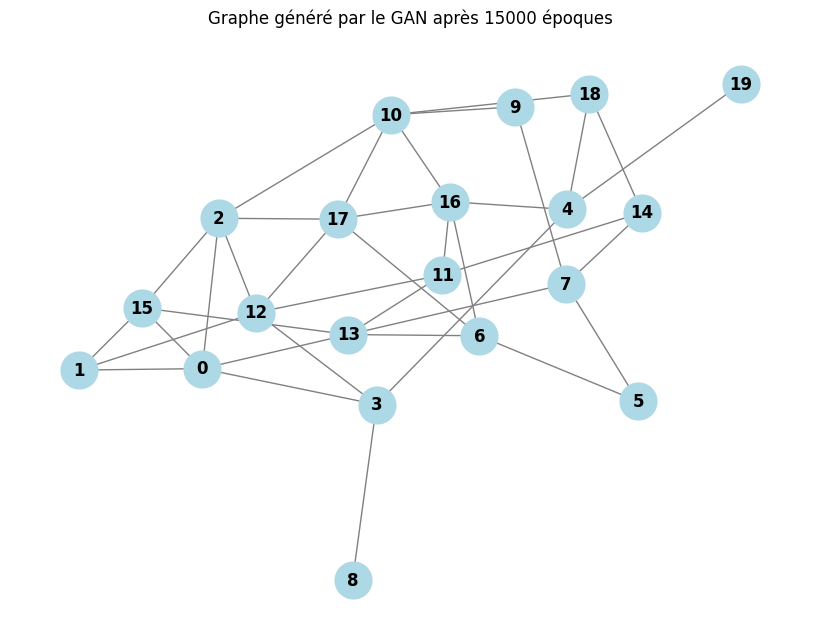

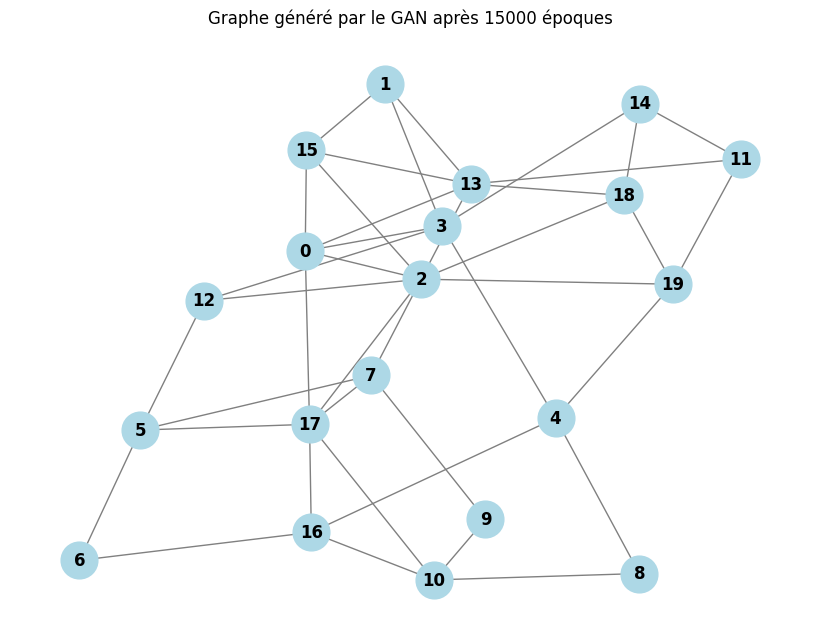

In [43]:
import os
import shutil

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

# Supprimer le contenu du dossier 'generated_graphs' s'il existe déjà
if os.path.exists('generated_graphs'):
    shutil.rmtree('generated_graphs')  # Supprime tout le dossier et son contenu
os.makedirs('generated_graphs', exist_ok=True)  # Recrée un répertoire vide

def generate_random_bipartite_graph(n):
    # Split n nodes into two partitions
    partition_size = n // 2
    remainder = n % 2

    # Generate a bipartite graph with partition_size nodes in each partition
    G = nx.bipartite.random_graph(partition_size, partition_size + remainder, 0.5)
    
    # Convert to adjacency matrix
    adj_matrix = nx.to_numpy_array(G)
    
    # Ensure the adjacency matrix is of size n x n
    if adj_matrix.shape != (n, n):
        adj_matrix = np.pad(adj_matrix, ((0, n - adj_matrix.shape[0]), (0, n - adj_matrix.shape[1])), mode='constant')
    
    return adj_matrix

def generate_random_planar_graph(n):
    # Calculer la taille de la grille
    side_length = int(np.ceil(np.sqrt(n)))
    
    # Créer un graphe de grille
    G = nx.grid_2d_graph(side_length, side_length)
    
    # Convertir les nœuds de la grille en un seul index
    mapping = {node: i for i, node in enumerate(G.nodes())}
    G = nx.relabel_nodes(G, mapping)
    
    # Si le nombre de nœuds est supérieur à n, supprimer les nœuds supplémentaires
    if len(G.nodes()) > n:
        nodes_to_remove = list(G.nodes())[n:]
        G.remove_nodes_from(nodes_to_remove)
    
    # Ajouter des arêtes aléatoires tout en vérifiant que le graphe reste planaire
    possible_edges = [(u, v) for u in range(n) for v in range(u + 1, n) if not G.has_edge(u, v)]
    np.random.shuffle(possible_edges)
    
    for u, v in possible_edges:
        G.add_edge(u, v)
        if not nx.check_planarity(G)[0]:
            G.remove_edge(u, v)
    
    # Convertir en matrice d'adjacence
    adj_matrix = nx.to_numpy_array(G)
    
    return adj_matrix
# Fonction pour générer un graphe avec des cycles aléatoires
def generate_random_cyclic_graph(n):
    G = nx.Graph()  # Créer un graphe non orienté
    # Ajouter des nœuds
    G.add_nodes_from(range(n))

    # Ajouter des arêtes pour créer un cycle
    edges = [(i, (i + 1) % n) for i in range(n)]  # Cycle de base
    G.add_edges_from(edges)

    # Ajouter des arêtes supplémentaires aléatoires pour augmenter la complexité
    while len(G.edges) < n + np.random.randint(1, n):  # On ajoute un certain nombre d'arêtes
        u, v = np.random.choice(n, 2, replace=False)
        G.add_edge(u, v)

    return nx.to_numpy_array(G)

def generate_random_cycle_graph(n):
    # Créer un graphe vide
    G = nx.Graph()
    
    # Ajouter des nœuds
    G.add_nodes_from(range(n))
    
    # Mélanger les sommets de manière aléatoire
    nodes = list(G.nodes())
    np.random.shuffle(nodes)
    
    # Ajouter des arêtes pour former un cycle
    edges = [(nodes[i], nodes[(i + 1) % n]) for i in range(n)]
    G.add_edges_from(edges)
    
    # Convertir en matrice d'adjacence
    adj_matrix = nx.to_numpy_array(G)
    
    return adj_matrix
    

def generate_random_binary_tree(n):
    # Créer un graphe orienté pour représenter un arbre binaire
    G = nx.DiGraph()  # Graphe orienté
    G.add_node(0)  # Ajouter la racine
    for i in range(1, n):
        parent = np.random.randint(0, i)  # Choisir un parent aléatoire
        # S'assurer que le parent n'a pas déjà deux enfants
        while G.out_degree(parent) >= 2:
            parent = np.random.randint(0, i)
        G.add_node(i)  # Ajouter le nœud
        G.add_edge(parent, i)  # Créer une arête orientée du parent vers l'enfant
    return nx.to_numpy_array(G)
def generate_random_tree(n):
    # Créer un graphe vide
    G = nx.Graph()
    G.add_nodes_from(range(n))
    
    # Ajouter des arêtes pour garantir la connexité
    for i in range(1, n):
        u = np.random.randint(0, i)
        G.add_edge(u, i)
    
    # Ajouter des arêtes supplémentaires aléatoires pour augmenter la complexité
    num_edges = np.random.randint(n - 1, n * (n - 1) // 2)  # Nombre d'arêtes entre n-1 (arbre minimum) et n*(n-1)/2 (graphe complet)
    while G.number_of_edges() < num_edges:
        u, v = np.random.choice(n, 2, replace=False)
        if not G.has_edge(u, v):
            G.add_edge(u, v)
    
    # Utiliser l'algorithme de Kruskal pour trouver un arbre couvrant minimum
    T = nx.minimum_spanning_tree(G, algorithm='boruvka')
    
    # Convertir en matrice d'adjacence et s'assurer qu'elle est de taille n x n
    adj_matrix = nx.to_numpy_array(T)
    if adj_matrix.shape != (n, n):
        adj_matrix = np.pad(adj_matrix, ((0, n - adj_matrix.shape[0]), (0, n - adj_matrix.shape[1])), mode='constant')
    
    return adj_matrix
# Générateur (Génère une matrice d'adjacence)
class GraphGenerator(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(GraphGenerator, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, output_dim),
            nn.Sigmoid()  # Pour générer des valeurs entre 0 et 1 pour la matrice d'adjacence
        )

    def forward(self, z):
        return self.fc(z)

# Discriminateur (Juge si une matrice d'adjacence est réelle ou générée)
class GraphDiscriminator(nn.Module):
    def __init__(self, input_dim):
        super(GraphDiscriminator, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, graph):
        return self.fc(graph)



# Enregistrer les graphes dans le dataset
def save_graphs(graph_dataset, n_graphs, n_nodes):
    for i in range(n_graphs):
        adj_matrix = graph_dataset[i].reshape(n_nodes, n_nodes)
        G = nx.from_numpy_array(adj_matrix)
        
        # Créer un fichier d'image pour chaque graphe
        plt.figure(figsize=(8, 6))
        try:
            nx.draw_planar(G, with_labels=True, node_color="lightblue", font_weight="bold", node_size=700, edge_color="gray")
        except nx.NetworkXException:
            # Si le graphe n'est pas planaire, utiliser un autre layout
            nx.draw(G, with_labels=True, node_color="lightblue", font_weight="bold", node_size=700, edge_color="gray")
        
        plt.title(f"Graphe {i + 1}")
        plt.show()

        # Enregistrer l'image dans le dossier 'generated_graphs'
        plt.savefig(f'generated_graphs/graph_{i + 1}.png')
        plt.close()  # Fermer la figure pour libérer de la mémoire

def train(n_nodes=10,n_graphs=100, fct=generate_random_binary_tree, num_epochs=10_000, batch_size=32, num_graphe_GAN=10):
    # Nombre de nœuds dans le graphe
    adj_matrix_dim = n_nodes * n_nodes  # Représentation sous forme de matrice d'adjacence

    # Créer les modèles
    generator = GraphGenerator(input_dim=adj_matrix_dim, output_dim=adj_matrix_dim)
    discriminator = GraphDiscriminator(input_dim=adj_matrix_dim)

    # Optimisateurs
    g_optimizer = optim.Adam(generator.parameters(), lr=0.001)
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.001)

    # Fonction de perte
    loss_fn = nn.BCELoss()

    # Générer un dataset de 100 graphes avec des cycles pour entraîner le discriminateur
    
    graph_dataset = np.array([fct(n_nodes) for _ in range(n_graphs)])
    graph_dataset = graph_dataset.reshape(n_graphs, -1)
    # Enregistrer les graphes dans le dataset
    save_graphs(graph_dataset, n_graphs, n_nodes)

    # Entraînement simplifié du GAN
    d_losses = []
    g_losses = []

    for epoch in range(num_epochs):
        # Étape 1: Entraîner le Discriminateur avec des graphes réels et générés
        idx = np.random.randint(0, n_graphs, batch_size)
        real_graphs = torch.tensor(graph_dataset[idx], dtype=torch.float32)  # Sélection de graphes réels
        z = torch.randn(batch_size, adj_matrix_dim)  # Bruit aléatoire pour le générateur
        fake_graphs = generator(z)

        real_labels = torch.ones(batch_size, 1)
        fake_labels = torch.zeros(batch_size, 1)

        d_optimizer.zero_grad()
        real_loss = loss_fn(discriminator(real_graphs), real_labels)
        fake_loss = loss_fn(discriminator(fake_graphs.detach()), fake_labels)
        d_loss = real_loss + fake_loss
        d_loss.backward()
        d_optimizer.step()

        # Étape 2: Entraîner le Générateur pour tromper le Discriminateur
        g_optimizer.zero_grad()
        generated_loss = loss_fn(discriminator(fake_graphs), real_labels)  # Le générateur essaie de tromper le discriminateur
        generated_loss.backward()
        g_optimizer.step()
        
        
        d_losses.append(d_loss.item())
        g_losses.append(generated_loss.item())

        # Afficher la perte toutes les 500 époques
        if epoch % 500 == 0:
            print(f"Epoch [{epoch}/{num_epochs}], Loss D: {d_loss.item()}, Loss G: {generated_loss.item()}")
    plt.figure(figsize=(10, 5))
    plt.plot(d_losses, label='Loss du discriminator')
    plt.plot(g_losses, label='Loss du generator')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss du GAN')
    plt.show()
    for _ in range(num_graphe_GAN):
        # Afficher le dernier graphe généré à la fin
        z = torch.randn(1, adj_matrix_dim)  # Bruit aléatoire
        generated_adj_matrix = generator(z).view(n_nodes, n_nodes).detach().numpy()

        # Binarisation de la matrice d'adjacence (seuil pour déterminer si une arête existe)
        threshold = 0.5
        binary_adj_matrix = (generated_adj_matrix > threshold).astype(int)

        # Création du graphe à partir de la matrice d'adjacence
        G = nx.from_numpy_array(binary_adj_matrix)

        # Visualisation du graphe
        plt.figure(figsize=(8, 6))
        try:
            nx.draw_planar(G, with_labels=True, node_color="lightblue", font_weight="bold", node_size=700, edge_color="gray")
        except nx.NetworkXException:
            # Si le graphe n'est pas planaire, utiliser un autre layout
            nx.draw(G, with_labels=True, node_color="lightblue", font_weight="bold", node_size=700, edge_color="gray")
        plt.title(f"Graphe généré par le GAN après {num_epochs} époques")
        plt.show()  # Afficher le dernier graphe généré

train(n_graphs=100,n_nodes=20,fct=generate_random_cyclic_graph, num_epochs=10_000, num_graphe_GAN=10)
